# Take-Home Assignment: Email Classification

**Traditional Pipeline of ML (Architecture)**

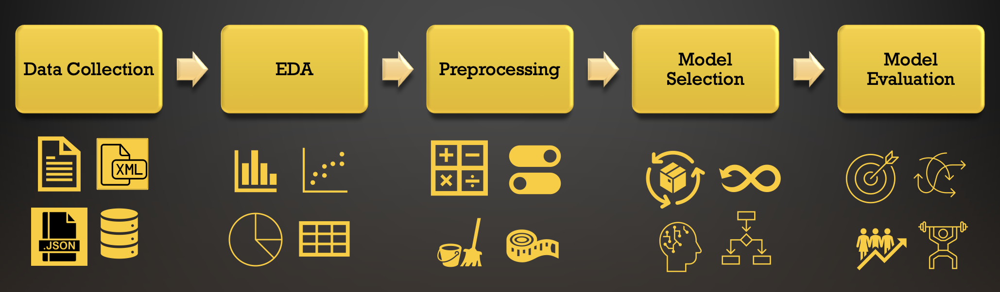

## Step 1: Data Collection and Preparation

Description

Gather a dataset of emails for training and testing purposes:
- Collect a diverse set of emails that represent different categories
and priorities. Ensure the dataset is balanced to avoid bias.

### Use Case

**Dataset Details**
- Source: Kaggle
- Author: Tobias Bueck
- Name: Customer IT Support - Ticket Dataset
- Description: Labeled Email Tickets with Agents answer, priorities, queues
- Link: [multilingual-customer-support-tickets](https://www.kaggle.com/datasets/tobiasbueck/multilingual-customer-support-tickets)

**Features / Attributes**
- Queue: Specifies the department to which the email ticket is routed. The values can be:
    - Technical Support: Technical issues and support requests.
    - Customer Service: Customer inquiries and service requests.
    - Billing and Payments: Billing issues and payment processing.
    - Product Support: Support for product-related issues.
    - IT Support: Internal IT support and infrastructure issues.
    - Returns and Exchanges: Product returns and exchanges.
    - Sales and Pre-Sales: Sales inquiries and pre-sales questions.
    - Human Resources: Employee inquiries and HR-related issues.
    - Service Outages and Maintenance: Service interruptions and maintenance.
    - General Inquiry: General inquiries and information requests.
- Priority:	Indicates the urgency and importance of the issue. The values can be:
    - 1 (Low): Non-urgent issues that do not require immediate attention. Examples: general inquiries, minor inconveniences, routine updates, and feature requests.
    - 2 (Medium): Moderately urgent issues that need timely resolution but are not critical. Examples: performance issues, intermittent errors, and detailed user questions.
    - 3 (Critical): Urgent issues that require immediate attention and quick resolution. Examples: system outages, security breaches, data loss, and major malfunctions.
- Language:	Indicates the language in which the email is written. Useful for language-specific NLP models and multilingual support analysis. The values can be:
    - en (English).
    - de (German).
- Subject: Subject of the customer's email.
- Body: Body of the customer's email.
- Answer: The response provided by the helpdesk agent, containing the resolution or further instructions. Useful for analyzing the quality and effectiveness of the support provided.
- Type: Different types of tickets categorized to understand the nature of the requests or issues. The values can be:
    - Incident: Unexpected issue requiring immediate attention.
    - Request: Routine inquiry or service request.
    - Problem: Underlying issue causing multiple incidents.
    - Change: Planned change or update.
- Business Type: The business type of the support helpdesk. Helps in understanding the context of the support provided. Examples: "Tech Online Store", "IT Services", "Software Development Company".
- Tags: Tags/categories assigned to the ticket to further classify and identify common issues or topics. Examples: "Product Support", "Technical Support", "Sales Inquiry".

**Ticketsystem — Ticket Flow**

<center><img src='https://miro.medium.com/v2/resize:fit:720/format:webp/1*7Swk3VoxoALHTfWetzvgLg.png'/></center>

**Network Diagram Tags**

<center><img src='https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F3023333%2F9f9df25b75671db2d255b2d284c2c80c%2Fnetwork_diagram.svg?generation=1739380045025331&alt=media' width='800'/></center>

**Project Details**

Context: It's common in companies to have customer support systems that have to deal with emails from customers which include tasks such as topic comprehension and criticality understanding in order to refer to an ideal department and prioratize according to level of urgency.

Problem: How to optimize and improve customer support systems in order to classify automatically emails by the respective topic and priority labels?

Solution: Create a specialist AI model based on Generative AI to perform a text classification and assign the correct label for each email regarding to both topic and priority.

Approach:
- Exploratory Data Analysis
- Text Preprocessing
- Text Embedding
- Machine Learning (Base Line)
- Deep Learning / Transformers / Generative AI (Model Selection)
- Fine Tuning
- Model Evaluation

Technologies and Tools:
- Python
    - Poetry
    - Numpy
    - Pandas
    - Matplotlib/Seaborn
    - NLTK/Spacy
    - Scikit-Learn
    - Tensorflow/Keras/Pytorch
    - Streamlit
    - FastAPI
- Kaggle/HuggingFace
    - Customer IT Support - Ticket Dataset
    - BERT
- Docker

### Environment Preparation

Python Packages

In [1]:
!pip install datasets numpy pandas matplotlib seaborn wordcloud nltk spacy scikit-learn torch transformers wandb python-dotenv ipywidgets
# !pip install datasets wandb python-dotenv

!pip install --upgrade 'accelerate>=0.26.0'

In [2]:
!python3 -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 20.9 MB/s eta 0:00:00a 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [3]:
import os
import sys
import pickle

from typing import List, Tuple, Dict, Any

import re
import unicodedata

from datasets import Dataset
import numpy as np
import pandas as pd

import wordcloud

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report

import nltk
import spacy

import torch

from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments

import wandb

from dotenv import load_dotenv

NLP Models

In [4]:
# Dowloading the list of stopwords in English
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nelsondressler/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
# Downloading the spaCy English model
nlp = spacy.load('en_core_web_sm')

Processor

In [6]:
def get_available_device():
    if torch.cuda.is_available():
        return 'cuda'
    elif torch.backends.mps.is_available():
        return 'mps'
    else:
        return 'cpu'

In [7]:
DEVICE = get_available_device()

In [8]:
if torch.cuda.is_available():
    print("GPU available:", torch.cuda.is_available())
    print("Device name:", torch.cuda.get_device_name(0))
elif torch.backends.mps.is_available():
    print("GPU available:", torch.backends.mps.is_available())
    print("Device name:", DEVICE)
else:
    print("GPU available:", False)
    print("Device name:", DEVICE)

GPU available: True
Device name: mps


Store

In [9]:
IN_COLAB = 'google.colab' in sys.modules

In [102]:
load_dotenv()

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    
    ROOT_PATH = os.getenv('COLAB_ROOT_PATH')

else:
    ROOT_PATH = os.getenv('LOCAL_ROOT_PATH')


RAW_DATASETS_PATH = os.path.join(ROOT_PATH, os.getenv('RAW_DATASETS_PATH'))
PROCESSED_DATASETS_PATH = os.path.join(ROOT_PATH, os.getenv('PROCESSED_DATASETS_PATH'))

BASELINE_MODELS_PATH = os.path.join(ROOT_PATH, os.getenv('BASELINE_MODELS_PATH'))
TRANSFORMERS_MODELS_PATH = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_MODELS_PATH'))

VECTORIZER_PATH = os.path.join(ROOT_PATH, os.getenv('VECTORIZER_PATH'))
NB_MODEL_QUEUE_PATH = os.path.join(ROOT_PATH, os.getenv('NB_MODEL_QUEUE_PATH'))
NB_MODEL_PRIORITY_PATH = os.path.join(ROOT_PATH, os.getenv('NB_MODEL_PRIORITY_PATH'))
LR_MODEL_QUEUE_PATH = os.path.join(ROOT_PATH, os.getenv('LR_MODEL_QUEUE_PATH'))
LR_MODEL_PRIORITY_PATH = os.path.join(ROOT_PATH, os.getenv('LR_MODEL_PRIORITY_PATH'))

TRANSFORMERS_OUTPUT_DIR = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_OUTPUT_DIR'))
TRANSFORMERS_LOGGING_DIR = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_LOGGING_DIR'))

MLOps Platform (Weights & Biases)

In [103]:
# !wandb login
wandb.login()

wandb: Currently logged in as: nelsondr58 (nelsondr58-njd-solutions) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

Hyperparameters

    Preprocessing

In [104]:
SEED = int(os.getenv('SEED'))
TEXT_COLUMN_NAME = os.getenv('TEXT_COLUMN_NAME')
LABEL_COLUMN_NAME = os.getenv('LABEL_COLUMN_NAME')
RESAMPLING_TYPE = os.getenv('RESAMPLING_TYPE')
N_SAMPLES_EACH_CATEGORY = int(os.getenv('N_SAMPLES_EACH_CATEGORY')) if os.getenv('N_SAMPLES_EACH_CATEGORY') != 'None' else None
N_MAX_WORDS = int(os.getenv('N_MAX_WORDS')) if os.getenv('N_MAX_WORDS') != 'None' else None
REMOVE_STOPWORDS = eval(os.getenv('REMOVE_STOPWORDS'))
REMOVE_PUNCTUATION = eval(os.getenv('REMOVE_PUNCTUATION'))
REMOVE_NUMBERS = eval(os.getenv('REMOVE_NUMBERS'))
LEMMATIZE = eval(os.getenv('LEMMATIZE'))

    Neural Network

In [105]:
RUN_FINE_TUNING = eval(os.getenv('RUN_FINE_TUNING'))
NUM_TRAIN_EPOCHS = int(os.getenv('NUM_TRAIN_EPOCHS'))
PER_DEVICE_TRAIN_BATCH_SIZE = int(os.getenv('PER_DEVICE_TRAIN_BATCH_SIZE'))
PER_DEVICE_EVAL_BATCH_SIZE = int(os.getenv('PER_DEVICE_EVAL_BATCH_SIZE'))
LEARNING_RATE = float(os.getenv('LEARNING_RATE'))
WEIGHT_DECAY = float(os.getenv('WEIGHT_DECAY'))

### Data Collection

In [106]:
emails_20k_df = pd.read_csv("hf://datasets/Tobi-Bueck/customer-support-tickets/dataset-tickets-multi-lang-4-20k.csv")

In [107]:
emails_20k_df

,subject,body,answer,type,queue,priority,language,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8
0,Unvorhergesehener Absturz der Datenanalyse-Pla...,Die Datenanalyse-Plattform brach unerwartet ab...,Ich werde Ihnen bei der Lösung des Problems he...,Incident,General Inquiry,low,de,Crash,Technical,Bug,Hardware,Resolution,Outage,Documentation,NaN
1,Customer Support Inquiry,Seeking information on digital strategies that...,We offer a variety of digital strategies and s...,Request,Customer Service,medium,en,Feedback,Sales,IT,Tech Support,NaN,NaN,NaN,NaN
2,Data Analytics for Investment,I am contacting you to request information on ...,I am here to assist you with data analytics to...,Request,Customer Service,medium,en,Technical,Product,Guidance,Documentation,Performance,Feature,NaN,NaN
3,Krankenhaus-Dienstleistung-Problem,Ein Medien-Daten-Sperrverhalten trat aufgrund ...,Zurück zur E-Mail-Beschwerde über den Sperrver...,Incident,Customer Service,high,de,Security,Breach,Login,Maintenance,Incident,Resolution,Feedback,NaN
4,Security,"Dear Customer Support, I am reaching out to in...","Dear [name], we take the security of medical d...",Request,Customer Service,medium,en,Security,Customer,Compliance,Breach,Documentation,Guidance,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,Assistance Needed for IFTTT Docker Integration,I am facing integration problems with IFTTT Do...,I would be happy to assist with the IFTTT Dock...,Problem,Technical Support,low,en,Integration,Disruption,Performance,IT,Tech Support,NaN,NaN,NaN
19996,Bitten um Unterstützung bei der Integration,"Sehr geehrte Kundenservice, ich möchte die Int...","Sehr geehrte [Name], vielen Dank für Ihren Kon...",Change,Technical Support,medium,de,Integration,Feature,Documentation,Tech Support,NaN,NaN,NaN,NaN
19997,NaN,"Hello Customer Support, I am inquiring about t...",We will send you detailed information on plans...,Request,Billing and Payments,low,en,Billing,Payment,Feature,Feedback,Sales,Lead,NaN,NaN
19998,Hilfe bei digitalen Strategie-Problemen,Die Qualität unserer digitalen Strategie-Bearb...,Um den digitalen Strategie-Impuls zu überprüfe...,Incident,Product Support,high,de,Feedback,Performance,IT,Tech Support,NaN,NaN,NaN,NaN


### Exploratory Data Analysis (EDA)

In [108]:
emails_20k_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   subject   18539 non-null  object
 1   body      19998 non-null  object
 2   answer    19996 non-null  object
 3   type      20000 non-null  object
 4   queue     20000 non-null  object
 5   priority  20000 non-null  object
 6   language  20000 non-null  object
 7   tag_1     20000 non-null  object
 8   tag_2     19954 non-null  object
 9   tag_3     19905 non-null  object
 10  tag_4     18461 non-null  object
 11  tag_5     13091 non-null  object
 12  tag_6     7351 non-null   object
 13  tag_7     3928 non-null   object
 14  tag_8     1907 non-null   object
dtypes: object(15)
memory usage: 2.3+ MB


In [109]:
emails_20k_df.shape

(20000, 15)

In [110]:
emails_20k_df.columns

Index(['subject', 'body', 'answer', 'type', 'queue', 'priority', 'language',
       'tag_1', 'tag_2', 'tag_3', 'tag_4', 'tag_5', 'tag_6', 'tag_7', 'tag_8'],
      dtype='object')

In [111]:
relevant_columns = ['subject', 'body', 'language', 'queue', 'priority']

In [112]:
emails_20k_df[relevant_columns]

,subject,body,language,queue,priority
0,Unvorhergesehener Absturz der Datenanalyse-Pla...,Die Datenanalyse-Plattform brach unerwartet ab...,de,General Inquiry,low
1,Customer Support Inquiry,Seeking information on digital strategies that...,en,Customer Service,medium
2,Data Analytics for Investment,I am contacting you to request information on ...,en,Customer Service,medium
3,Krankenhaus-Dienstleistung-Problem,Ein Medien-Daten-Sperrverhalten trat aufgrund ...,de,Customer Service,high
4,Security,"Dear Customer Support, I am reaching out to in...",en,Customer Service,medium
...,...,...,...,...,...
19995,Assistance Needed for IFTTT Docker Integration,I am facing integration problems with IFTTT Do...,en,Technical Support,low
19996,Bitten um Unterstützung bei der Integration,"Sehr geehrte Kundenservice, ich möchte die Int...",de,Technical Support,medium
19997,NaN,"Hello Customer Support, I am inquiring about t...",en,Billing and Payments,low
19998,Hilfe bei digitalen Strategie-Problemen,Die Qualität unserer digitalen Strategie-Bearb...,de,Product Support,high


In [113]:
emails_20k_df['language'].value_counts()

language
en    11923
de     8077
Name: count, dtype: int64

In [114]:
emails_20k_df.isna().sum()

subject      1461
body            2
answer          4
type            0
queue           0
priority        0
language        0
tag_1           0
tag_2          46
tag_3          95
tag_4        1539
tag_5        6909
tag_6       12649
tag_7       16072
tag_8       18093
dtype: int64

In [115]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordclouds_by_rows_and_cols(
        df: pd.DataFrame,
        text_column_name: str = 'text',
        rows_column_name: str = None,
        cols_column_name: str = None,
        n_max_words: int = 100,
        random_state: int = 42
):
    """
    Create wordclouds for each unique value in rows_column_name and cols_column_name.

    Args:
        df (pd.DataFrame): The input DataFrame.
        text_column_name (str): The name of the column containing text data.
        rows_column_name (str): The name of the column to group by for rows.
        cols_column_name (str): The name of the column to group by for columns.
        n_max_words (int): The maximum number of words to include in the wordcloud.
        random_state (int): The random state for reproducibility.

    Raises:
        ValueError: If either 'rows_column_name' or 'cols_column_name' is provided, but not both.
    """

    if not rows_column_name and not cols_column_name:
        raise ValueError("Either 'rows_column_name' or 'cols_column_name' must be provided.")

    if rows_column_name:
        rows_column_name_display = rows_column_name.title()
        rows_column_values = df[rows_column_name].unique()
        nrows = len(rows_column_values)
    else:
        nrows = 1

    if cols_column_name:
        cols_column_name_display = cols_column_name.title()
        cols_column_values = df[cols_column_name].unique()
        ncols = len(cols_column_values)
    else:
        ncols = 1

    if rows_column_name and cols_column_name:
        plot_title = f'Wordclouds by {rows_column_name_display} and {cols_column_name_display}'
        df_grouped = df.groupby(by=[rows_column_name, cols_column_name])
    elif rows_column_name:
        plot_title = f'Wordclouds by {rows_column_name_display}'
        df_grouped = df.groupby(by=[rows_column_name])
        column_name = rows_column_name
        column_name_display = rows_column_name_display
        column_values = rows_column_values
    elif cols_column_name:
        plot_title = f'Wordclouds by {cols_column_name_display}'
        df_grouped = df.groupby(by=[cols_column_name])
        column_name = cols_column_name
        column_name_display = cols_column_name_display
        column_values = cols_column_values

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 10, nrows * 5))
    fig.suptitle(plot_title, fontsize=30)

    for group_name, group_df in df_grouped:
        text = ' '.join(group_df[text_column_name].astype(str))
        wordcloud = WordCloud(max_words=n_max_words, random_state=SEED).generate(text)

        if len(group_name) == 2:
            row_column_value = group_name[0]
            col_column_value = group_name[1]
            row_column_value_display = row_column_value.title()
            col_column_value_display = col_column_value.title()

            i = rows_column_values.tolist().index(row_column_value)
            j = cols_column_values.tolist().index(col_column_value)

            ax = axes[i, j]
            subplot_title = f'{rows_column_name_display}: {row_column_value_display}, {cols_column_name_display}: {col_column_value_display}'

        else:
            column_value = group_name[0]
            column_value_display = column_value.title()
            i = column_values.tolist().index(column_value)

            ax = axes[i]
            subplot_title = f'{column_name_display}: {column_value_display}'

        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(subplot_title)
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.subplots_adjust(top=0.9)
    plt.show()

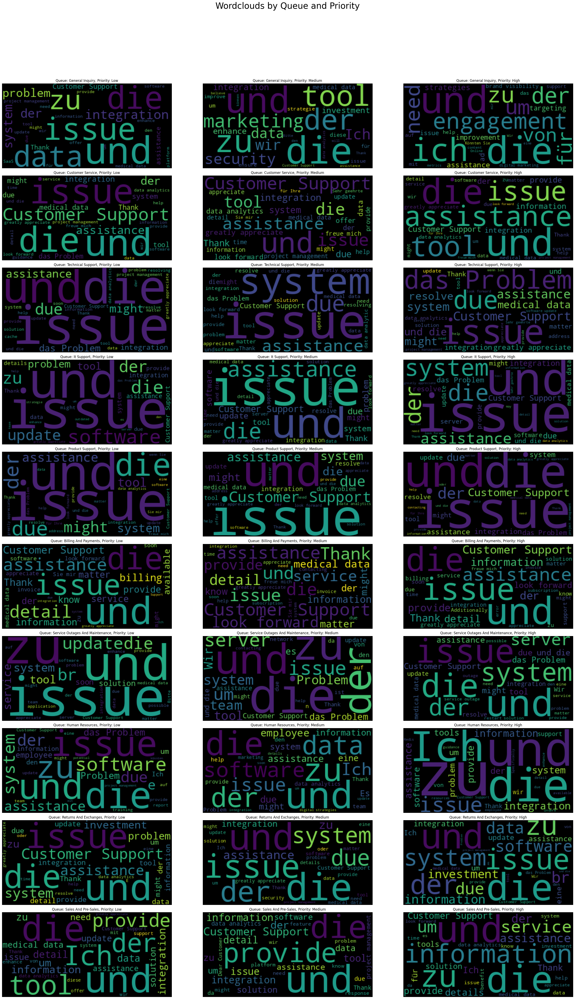

In [116]:
create_wordclouds_by_rows_and_cols(
    df=emails_20k_df,
    text_column_name='body',
    rows_column_name='queue',
    cols_column_name='priority',
    n_max_words=30
)

### Data Preprocessing

#### Filtering

In [117]:
emails_20k_en_df = emails_20k_df[emails_20k_df['language'] == 'en'].copy()

emails_20k_en_df

,subject,body,answer,type,queue,priority,language,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8
1,Customer Support Inquiry,Seeking information on digital strategies that...,We offer a variety of digital strategies and s...,Request,Customer Service,medium,en,Feedback,Sales,IT,Tech Support,NaN,NaN,NaN,NaN
2,Data Analytics for Investment,I am contacting you to request information on ...,I am here to assist you with data analytics to...,Request,Customer Service,medium,en,Technical,Product,Guidance,Documentation,Performance,Feature,NaN,NaN
4,Security,"Dear Customer Support, I am reaching out to in...","Dear [name], we take the security of medical d...",Request,Customer Service,medium,en,Security,Customer,Compliance,Breach,Documentation,Guidance,NaN,NaN
5,Concerns About Securing Medical Data on 2-in-1...,Inquiring about best practices for securing me...,Thank you for your concern regarding securing ...,Request,Technical Support,medium,en,Security,Product,Feature,IT,Tech Support,NaN,NaN,NaN
7,Problem with Integration,"The integration stopped working unexpectedly, ...",I will look into the problem and call you at <...,Problem,IT Support,high,en,Technical,Integration,Bug,Resolution,Outage,Documentation,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19992,Guidelines for Securing Medical Data in OBS St...,Seeking details on securing medical data using...,Offering general security guidelines for OBS S...,Request,Technical Support,high,en,Security,Documentation,IT,NaN,NaN,NaN,NaN,NaN
19993,NaN,Can you provide information on digital strateg...,I would be happy to discuss digital strategies...,Request,Billing and Payments,medium,en,Feedback,Sales,Lead,NaN,NaN,NaN,NaN,NaN
19994,Support for Marketing Enhancements,Request for assistance in improving digital ma...,Ready to help with your marketing support need...,Change,Technical Support,high,en,Feedback,Sales,Marketing,Documentation,Tech Support,NaN,NaN,NaN
19995,Assistance Needed for IFTTT Docker Integration,I am facing integration problems with IFTTT Do...,I would be happy to assist with the IFTTT Dock...,Problem,Technical Support,low,en,Integration,Disruption,Performance,IT,Tech Support,NaN,NaN,NaN


In [118]:
emails_20k_en_df.isna().sum()

subject      1032
body            1
answer          3
type            0
queue           0
priority        0
language        0
tag_1           0
tag_2          10
tag_3          44
tag_4         873
tag_5        4038
tag_6        7385
tag_7        9358
tag_8       10596
dtype: int64

In [119]:
emails_20k_en_df = emails_20k_en_df.dropna(subset=['subject', 'body'], how='all')

In [120]:
filter_nan_subject = emails_20k_en_df['subject'].isna()
emails_20k_en_df[filter_nan_subject][['subject', 'body']]

,subject,body
19,NaN,"To Whom It May Concern, I am contacting you to..."
42,NaN,"During the last deployment, users encountered ..."
56,NaN,"Dear Customer Support, the critical data analy..."
82,NaN,"Dear Customer Support, I am in need of your as..."
97,NaN,Assistance needed for data breach in hospital ...
...,...,...
19930,NaN,"To Customer Support, I need help with a critic..."
19954,NaN,Looking for assistance in securing medical dat...
19986,NaN,"Dear Customer Support, our agency is facing co..."
19993,NaN,Can you provide information on digital strateg...


In [121]:
filter_nan_body = emails_20k_en_df['body'].isna()
emails_20k_en_df[filter_nan_body][['subject', 'body']]

,subject,body
17687,Moodle integration broke unexpectedly due to a...,NaN


In [122]:
emails_20k_en_df['subject'] = emails_20k_en_df['subject'].fillna('No subject')
emails_20k_en_df['body'] = emails_20k_en_df['body'].fillna('No body')

In [123]:
freq_queue = emails_20k_en_df['queue'].value_counts()

freq_queue

queue
Technical Support                  3412
Product Support                    2232
Customer Service                   1859
IT Support                         1391
Billing and Payments               1302
Returns and Exchanges               582
Service Outages and Maintenance     442
Sales and Pre-Sales                 330
Human Resources                     205
General Inquiry                     168
Name: count, dtype: int64

In [124]:
queue_unique_values = emails_20k_en_df['queue'].unique().tolist()

queue_unique_values

['Customer Service',
 'Technical Support',
 'IT Support',
 'Product Support',
 'Billing and Payments',
 'Service Outages and Maintenance',
 'Human Resources',
 'Returns and Exchanges',
 'Sales and Pre-Sales',
 'General Inquiry']

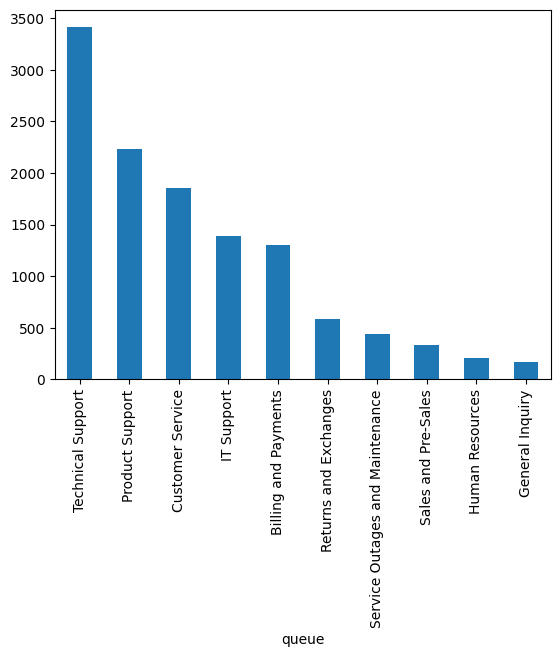

In [125]:
freq_queue.plot(kind='bar')
plt.show()

In [126]:
priority_unique_values = emails_20k_en_df['priority'].unique().tolist()

priority_unique_values

['medium', 'high', 'low']

In [127]:
freq_priority = emails_20k_en_df['priority'].value_counts()

freq_priority

priority
medium    4952
high      4571
low       2400
Name: count, dtype: int64

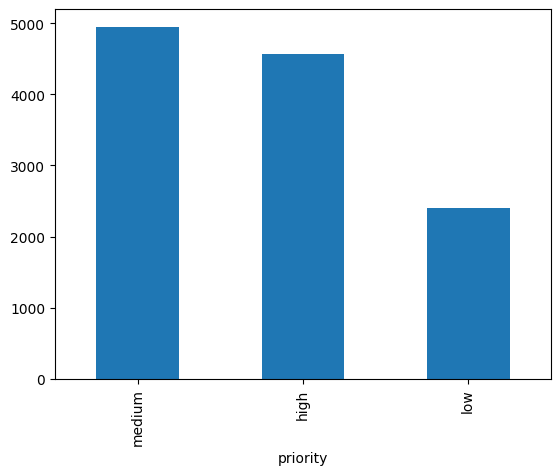

In [128]:
freq_priority.plot(kind='bar')
plt.show()

In [129]:
queue_priority_unique_values = emails_20k_en_df[['queue', 'priority']].value_counts().index.tolist()

queue_priority_unique_values

[('Technical Support', 'high'),
 ('Product Support', 'medium'),
 ('Technical Support', 'medium'),
 ('Customer Service', 'medium'),
 ('Product Support', 'high'),
 ('Billing and Payments', 'medium'),
 ('IT Support', 'high'),
 ('IT Support', 'medium'),
 ('Customer Service', 'low'),
 ('Technical Support', 'low'),
 ('Product Support', 'low'),
 ('Billing and Payments', 'high'),
 ('Customer Service', 'high'),
 ('Service Outages and Maintenance', 'high'),
 ('Billing and Payments', 'low'),
 ('Returns and Exchanges', 'medium'),
 ('Returns and Exchanges', 'low'),
 ('Sales and Pre-Sales', 'medium'),
 ('IT Support', 'low'),
 ('Returns and Exchanges', 'high'),
 ('Sales and Pre-Sales', 'low'),
 ('General Inquiry', 'low'),
 ('Human Resources', 'low'),
 ('Human Resources', 'medium'),
 ('Service Outages and Maintenance', 'medium'),
 ('Sales and Pre-Sales', 'high'),
 ('Service Outages and Maintenance', 'low'),
 ('General Inquiry', 'medium'),
 ('General Inquiry', 'high'),
 ('Human Resources', 'high')]

In [130]:
freq_queue_priority = emails_20k_en_df[['queue', 'priority']].value_counts(sort=False)

freq_queue_priority

queue                            priority
Billing and Payments             high         363
                                 low          273
                                 medium       666
Customer Service                 high         337
                                 low          566
                                 medium       956
General Inquiry                  high          28
                                 low          110
                                 medium        30
Human Resources                  high          23
                                 low           92
                                 medium        90
IT Support                       high         642
                                 low          151
                                 medium       598
Product Support                  high         701
                                 low          413
                                 medium      1118
Returns and Exchanges            high         130
        

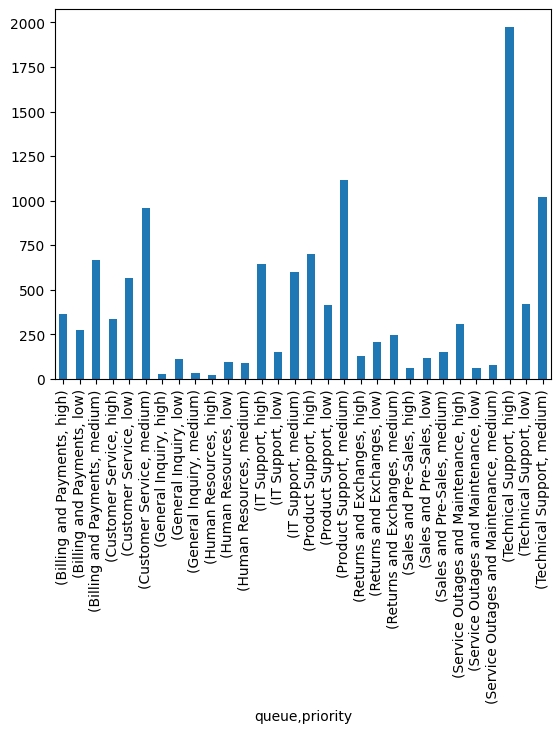

In [131]:
freq_queue_priority.plot(kind='bar')
plt.show()

#### Resampling

In [132]:
def undersample_df(df: pd.DataFrame, columns: List[str], n_samples_each_category: int = None, random_state: int = 42):
    """
    Undersamples a DataFrame based on a subset of columns to create a balanced dataset.

    Args:
        df (pd.DataFrame): The input DataFrame to be undersampled.
        columns (List[str]): The columns to group the DataFrame by for undersampling.
        n_samples_each_category (int, optional): The number of samples to keep from each category.
            If None, all samples from each category will be kept. Defaults to None.
        random_state (int, optional): The random state for reproducibility. Defaults to 42.

    Returns:
        pd.DataFrame: The undersampled DataFrame.
    """
    if n_samples_each_category is None:
        n_samples = df.groupby(columns).size().min()
    else:
        n_samples = n_samples_each_category
    undersampled_dfs = []

    undersampled_dfs = df.groupby(columns).sample(n=n_samples, replace=False, random_state=random_state)

    return undersampled_dfs

In [133]:
def oversample_df(df: pd.DataFrame, columns: List[str], random_state: int = 42):
    """
    Oversamples a DataFrame based on a subset of columns to create a balanced dataset.

    Args:
        df (pd.DataFrame): The input DataFrame to be oversampled.
        columns (List[str]): The columns to group the DataFrame by for oversampling.
        random_state (int, optional): The random state for reproducibility. Defaults to 42.

    Returns:
        pd.DataFrame: The oversampled DataFrame.
    """

    max_samples = df.groupby(columns).size().max()
    oversampled_dfs = []

    for group_name, group_df in df.groupby(columns):
        n_samples = max_samples - len(group_df)

        oversampled_dfs.append(group_df.sample(n=n_samples, replace=True, random_state=random_state))

    return pd.concat(oversampled_dfs)

In [134]:
if RESAMPLING_TYPE == 'undersample':
    sampled_emails_df = undersample_df(
        df=emails_20k_en_df,
        columns=LABEL_COLUMN_NAME.split('&'),
        n_samples_each_category=N_SAMPLES_EACH_CATEGORY,
        random_state=SEED
    )
elif RESAMPLING_TYPE == 'oversample':
    sampled_emails_df = oversample_df(
        df=emails_20k_en_df,
        columns=LABEL_COLUMN_NAME.split('&'),
        random_state=SEED
    )
else:
    sampled_emails_df = emails_20k_en_df.copy()

In [135]:
sampled_emails_df

,subject,body,answer,type,queue,priority,language,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8
6557,Urgent Assistance Required for Security Issues,"A security breach has occurred, compromising m...",We are reviewing the security breach and will ...,Problem,Technical Support,high,en,Security,Bug,IT,Tech Support,NaN,NaN,NaN,NaN
82,No subject,"Dear Customer Support, I am in need of your as...",I will assist you in securing your network and...,Problem,Billing and Payments,high,en,Security,Breach,Network,Guidance,Documentation,Incident,NaN,NaN
1071,Upgrading Workstation for Enhanced Data Analysis,"Hello Customer Support, I am reaching out to r...","Hello [Name], we have received your request fo...",Change,Technical Support,high,en,Hardware,Upgrade,Performance,Customer,Account,Feedback,NaN,NaN
11458,Request for Laravel Optimization Guidance,I am contacting you to seek advice on enhancin...,"Dear [Name], we thank you for your inquiry reg...",Request,Technical Support,high,en,Technical,Guidance,Performance,Documentation,Optimization,Feedback,NaN,NaN
17361,Users Encountering Connectivity Problems in Va...,"Hello Support Team, we are facing connectivity...","Dear [Customer Name], we are responding to you...",Incident,Technical Support,high,en,Network,Performance,Outage,Disruption,IT,Tech Support,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9336,Enquiry on Data Analytics Software Training,"Hello support team, I am interested in learnin...","Hello <name>, thank you for contacting our sup...",Request,Human Resources,medium,en,Training,Documentation,Guidance,Onboarding,NaN,NaN,NaN,NaN
4524,Data Import Met with Challenges Today,The process of importing data is encountering ...,"Dear <name>, thank you for bringing the data i...",Problem,Technical Support,medium,en,Technical,Bug,Documentation,Guidance,Feedback,NaN,NaN,NaN
180,Healthcare Access Concern,I am encountering an undesired medical data ac...,"Dear <name>, I apologize for the inconvenience...",Incident,IT Support,medium,en,Login,Security,Account,Documentation,Guidance,Disruption,Follow-Up,NaN
8706,Report on Recent System Outage,A recent system outage has impacted access to ...,We have received your report on the recent sys...,Incident,IT Support,medium,en,Outage,Disruption,Maintenance,Recovery,IT,Tech Support,NaN,NaN


In [136]:
new_freq_queue = sampled_emails_df['queue'].value_counts()

new_freq_queue

queue
Technical Support                  1933
Product Support                    1313
Customer Service                   1207
Billing and Payments                813
IT Support                          762
Returns and Exchanges               392
Service Outages and Maintenance     267
Sales and Pre-Sales                 220
Human Resources                     153
General Inquiry                     140
Name: count, dtype: int64

<Axes: xlabel='queue'>

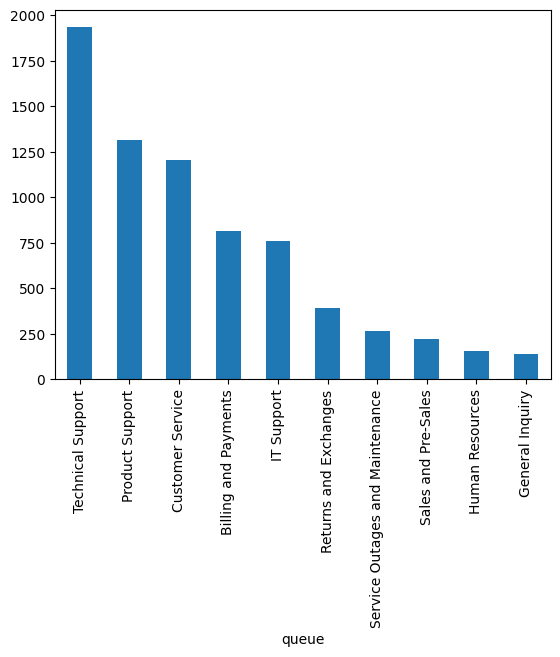

In [137]:
new_freq_queue.plot(kind='bar')

In [138]:
new_freq_priority = sampled_emails_df['priority'].value_counts()

new_freq_priority

priority
high      2400
low       2400
medium    2400
Name: count, dtype: int64

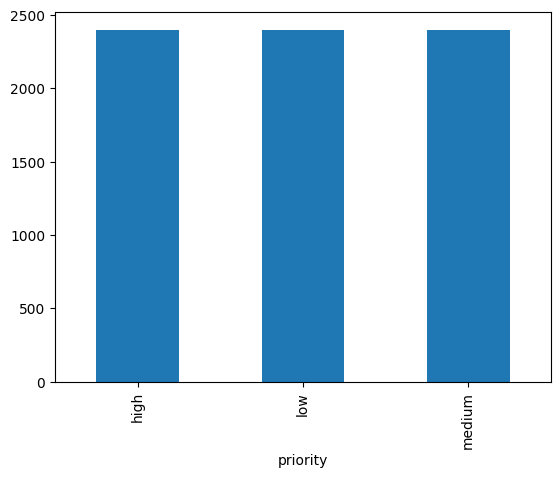

In [139]:
new_freq_priority.plot(kind='bar')
plt.show()

#### Features (Input)

In [140]:
def process_email_content(content_type: str = 'both', subject: str = None, body: str = None):
    if content_type == 'both':
        if not subject or pd.isna(subject) or subject == '' or subject == 'No subject':
            preprocessed_text = body
        elif not body or pd.isna(body) or body == '' or body == 'No body':
            preprocessed_text = subject
        else:
            preprocessed_text = f"""subject: {subject}\nbody: {body}"""
    elif content_type == 'subject':
        if not subject or pd.isna(subject) or subject == '' or subject == 'No subject':
            preprocessed_text = ''
        else:
            preprocessed_text = subject
    elif content_type == 'body':
        if not body or pd.isna(body) or body == '' or body == 'No body':
            preprocessed_text = ''
        else:
            preprocessed_text = body

    return preprocessed_text

In [141]:
if TEXT_COLUMN_NAME == 'subject&body':
    sampled_emails_df['email_content'] = sampled_emails_df.apply(
        lambda row: process_email_content(
            content_type='both',
            subject=row['subject'],
            body=row['body']
        ),
        axis=1
    )
elif TEXT_COLUMN_NAME == 'subject':
    sampled_emails_df['email_content'] = sampled_emails_df.apply(
        lambda row: process_email_content(
            content_type='subject',
            subject=row['subject']
        ),
        axis=1
    )
elif TEXT_COLUMN_NAME == 'body':
    sampled_emails_df['email_content'] = sampled_emails_df.apply(
        lambda row: process_email_content(
            content_type='body',
            body=row['body']
        ),
        axis=1
    )

In [142]:
def preprocess_text(
    text: str,
    remove_stopwords: bool = False,
    remove_punctuation: bool = False,
    remove_numbers: bool = False,
    lemmatize: bool = False,
    n_max_words: int = None
):
    if remove_punctuation:
        text = re.sub(r'[^\w\s]', '', text)

    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    text = text.lower()
    text = re.sub(r'[\n\t]', ' ', text)
    text = re.sub(r' +', ' ', text)

    text = text.strip()

    if remove_stopwords:
        text = ' '.join([word for word in text.split() if word not in nltk.corpus.stopwords.words('english')])

    if lemmatize:
        doc = nlp(text)
        text = ' '.join([token.lemma_ for token in doc])

    if remove_numbers:
        text = re.sub(r'\d+', '', text)

    if n_max_words:
        text = ' '.join(text.split()[:n_max_words])

    return text

In [143]:
sampled_emails_df['text'] = sampled_emails_df['email_content'].apply(
    lambda text: preprocess_text(
        text=text,
        remove_stopwords=REMOVE_STOPWORDS,
        remove_punctuation=REMOVE_PUNCTUATION,
        remove_numbers=REMOVE_NUMBERS,
        n_max_words=N_MAX_WORDS
    )
)

In [144]:
def preprocess_label(labels: List[str]):
    label = ','.join(labels)

    return label

In [145]:
if '&' in LABEL_COLUMN_NAME:
    sampled_emails_df[LABEL_COLUMN_NAME] = sampled_emails_df.apply(
        lambda row: preprocess_label(labels=[row[col] for col in LABEL_COLUMN_NAME.split('&')]),
        axis=1
    )

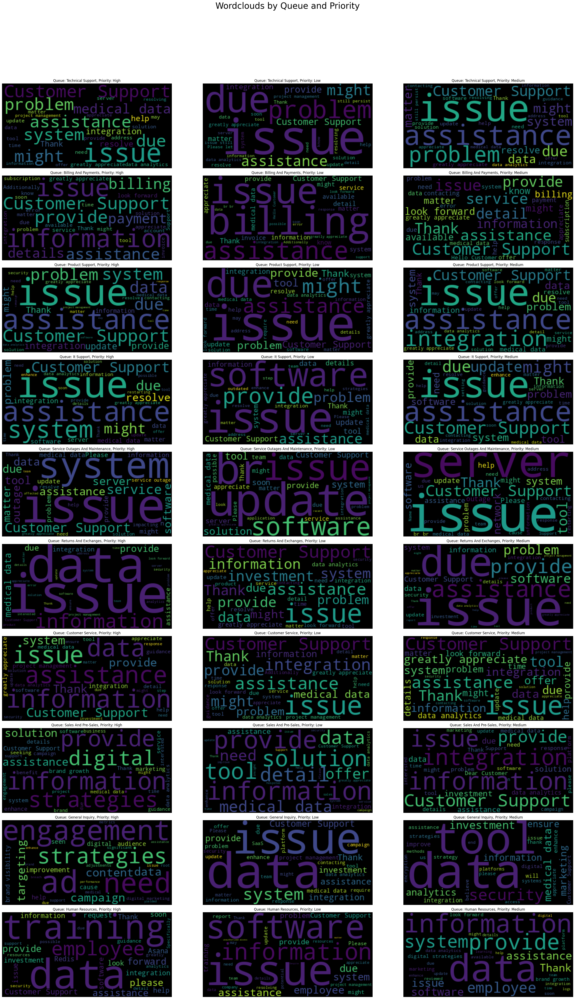

In [146]:
create_wordclouds_by_rows_and_cols(
    df=sampled_emails_df,
    text_column_name='body',
    rows_column_name='queue',
    cols_column_name='priority',
    n_max_words=30,
    random_state=SEED
)

#### Label (Output)

In [147]:
label_encoder = LabelEncoder()

sampled_emails_df['label'] = label_encoder.fit_transform(sampled_emails_df[LABEL_COLUMN_NAME])

#### Final Data (Input + Output)

In [148]:
data_df = sampled_emails_df[['text', 'label']].copy()

In [149]:
data_df

,text,label
6557,security breach occurred compromising medical ...,0
82,dear customer support need assistance encounte...,0
1071,hello customer support reaching request upgrad...,0
11458,contacting seek advice enhancing performance d...,0
17361,hello support team facing connectivity issues ...,0
...,...,...
9336,hello support team interested learning trainin...,2
4524,process importing data encountering issues pos...,2
180,encountering undesired medical data access den...,2
8706,recent system outage impacted access smartgara...,2


In [150]:
x_train_val, x_test, y_train_val, y_test = train_test_split(data_df['text'], data_df['label'], test_size=0.2, random_state=42)

x_train, x_val, y_train, y_val = train_test_split(x_train_val, y_train_val, test_size=0.2, random_state=42)

In [151]:
print(x_train_val.shape)
print(x_test.shape)
print(x_train.shape)
print(x_val.shape)

(5760,)
(1440,)
(4608,)
(1152,)


In [152]:
idx = 0
text = x_train.values[idx]
label_number = y_train.values[idx]
label = label_encoder.inverse_transform([y_train.values[idx]])[0]

print(f"Text: {text}")
print(f"Label Number: {label_number}")
print(f"Label: {label}")

Text: dear customer support currently experiencing intermittent connectivity issues software tools integrated project management saas issues might arisen due recent updates conflicts thirdparty services already attempted resolve issue clearing caches restarting services verifying api credentials problem still persists would greatly appreciate assistance troubleshooting resolving issue soon possible please let us know additional information steps required
Label Number: 2
Label: medium


In [153]:
idx = 1
text = x_train.values[idx]
label_number = y_train.values[idx]
label = label_encoder.inverse_transform([y_train.values[idx]])[0]

print(f"Text: {text}")
print(f"Label Number: {label_number}")
print(f"Label: {label}")

Text: could specify protocols
Label Number: 0
Label: high


In [154]:
idx = 2
text = x_train.values[idx]
label_number = y_train.values[idx]
label = label_encoder.inverse_transform([y_train.values[idx]])[0]

print(f"Text: {text}")
print(f"Label Number: {label_number}")
print(f"Label: {label}")

Text: dear customer support encountering system outage disrupted data analytics processes investment optimization issue might due server overload software conflicts attempted restart affected services clear temporary files problem persists would greatly appreciate assistance resolving matter soon possible please let us know require additional information facilitate resolution process thank support
Label Number: 0
Label: high


In [155]:
original_train_df = sampled_emails_df.loc[x_train.index, ['email_content', LABEL_COLUMN_NAME]].copy()

file_name = 'original_train_df.csv'
file_path = os.path.join(RAW_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

original_train_df.to_csv(file_path, index=False)

In [156]:
preprocessed_train_df = pd.concat([x_train, y_train], axis=1)

file_name = 'preprocessed_train_df.csv'
file_path = os.path.join(PROCESSED_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

preprocessed_train_df.to_csv(file_path, index=False)

In [157]:
original_val_df = sampled_emails_df.loc[x_val.index, ['email_content', LABEL_COLUMN_NAME]].copy()

file_name = 'original_val_df.csv'
file_path = os.path.join(RAW_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

original_val_df.to_csv(file_path, index=False)

In [158]:
preprocessed_val_df = pd.concat([x_val, y_val], axis=1)

file_name = 'preprocessed_val_df.csv'
file_path = os.path.join(PROCESSED_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

preprocessed_val_df.to_csv(file_path, index=False)

In [159]:
original_test_df = sampled_emails_df.loc[x_test.index, ['email_content', LABEL_COLUMN_NAME]].copy()

file_name = 'original_test_df.csv'
file_path = os.path.join(RAW_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

original_test_df.to_csv(file_path, index=False)

In [160]:
preprocessed_test_df = pd.concat([x_test, y_test], axis=1)

file_name = 'preprocessed_test_df.csv'
file_path = os.path.join(PROCESSED_DATASETS_PATH, file_name)

os.makedirs(os.path.dirname(file_path), exist_ok=True)

preprocessed_test_df.to_csv(file_path, index=False)

## Step 2: Model Training and Fine-Tuning

Description

Fine-tune the selected GenAI model on the prepared email dataset

### Model Selection and Evaluation

#### Model Baseline

In [161]:
vectorizer = TfidfVectorizer(ngram_range=(1, 2), smooth_idf=True, use_idf=True)

x_train_vectorized = vectorizer.fit_transform(x_train)
x_val_vectorized = vectorizer.transform(x_val)

In [162]:
vectorizer_filename = 'vectorizer.pkl'
vectorizer_filepath = os.path.join(BASELINE_MODELS_PATH, vectorizer_filename)

with open(vectorizer_filepath, "wb") as f:
    pickle.dump(vectorizer, f)

Naive Bayes

In [163]:
nb_classifier = MultinomialNB()

nb_classifier.fit(x_train_vectorized, y_train)

MultinomialNB()

In [164]:
nb_classifier.score(x_train_vectorized, y_train)

0.919921875

In [165]:
nb_classifier.score(x_val_vectorized, y_val)

0.4904513888888889

In [166]:
nb_model_filename = f'nb_model_{LABEL_COLUMN_NAME}.pkl'
nb_model_filepath = os.path.join(BASELINE_MODELS_PATH, nb_model_filename)

with open(nb_model_filepath, "wb") as f:
    pickle.dump(nb_classifier, f)

Logistic Regression

In [167]:
lr_classifier = LogisticRegression(solver='lbfgs')

lr_classifier.fit(x_train_vectorized, y_train)

LogisticRegression()

In [168]:
lr_classifier.score(x_train_vectorized, y_train)

0.9576822916666666

In [169]:
lr_classifier.score(x_val_vectorized, y_val)

0.5069444444444444

In [170]:
lr_model_filename = f'lr_model_{LABEL_COLUMN_NAME}.pkl'
lr_model_filepath = os.path.join(BASELINE_MODELS_PATH, lr_model_filename)

with open(lr_model_filepath, "wb") as f:
    pickle.dump(lr_classifier, f)

#### Transformers

In [171]:
# Create a Dataset object from your training and test data
train_dataset = Dataset.from_pandas(pd.DataFrame({'text': x_train.tolist(), 'label': y_train.tolist()}))
test_dataset = Dataset.from_pandas(pd.DataFrame({'text': x_val.tolist(), 'label': y_val.tolist()}))

In [172]:
def fine_tune_sequence_model(
    pretrained_model: str,
    run_name: str,
    train_dataset: Dataset,
    test_dataset: Dataset,
    num_labels: int,
    num_train_epochs: int = 3,
    per_device_train_batch_size: int = 8,
    per_device_eval_batch_size: int = 8,
    learning_rate: float = 2e-5,
    weight_decay: float = 0.01,
    save_path: str = './fine_tuned_sequence_model',
    device: str = 'cpu'
) -> Tuple[Any, Any, Dict[str, float]]:
    """
    Fine-tunes a given transformer model on the provided dataset and evaluates its performance.

    Args:
        pretrained_model (str): The name or path of the pre-trained model.
        run_name (str): The name of the run or experiment.
        train_dataset (Dataset): The Hugging Face Dataset for training.
        test_dataset (Dataset): The Hugging Face Dataset for testing.
        num_labels (int): The number of labels for classification.
        num_train_epochs (int, optional): The number of training epochs. Defaults to 3.
        per_device_train_batch_size (int, optional): The batch size for training. Defaults to 8.
        per_device_eval_batch_size (int, optional): The batch size for evaluation. Defaults to 8.
        learning_rate (float, optional): The learning rate for training. Defaults to 2e-5.
        weight_decay (float, optional): The weight decay for regularization. Defaults to 0.01.
        save_path (str): The path to save the fine-tuned model.
        device (str): The device to run the training on. Defaults to 'cpu'.

    Returns:
        Tuple[Any, Any, Dict[str, float]]:
        - The fine-tuned model.
        - The tokenizer used for processing text data.
        - A dictionary containing evaluation metrics (accuracy, precision, recall, F1-score).
    """
    # Load tokenizer
    try:
        tokenizer = AutoTokenizer.from_pretrained(pretrained_model, use_fast=True)
    except Exception:
        tokenizer = AutoTokenizer.from_pretrained(pretrained_model, use_fast=False)

    # Tokenization function
    def tokenize_function(examples: Dict[str, list]) -> Dict[str, list]:
        return tokenizer(examples["text"], padding="max_length", truncation=True)

    # Tokenize datasets
    tokenized_train_dataset = train_dataset.map(tokenize_function, batched=True)
    tokenized_test_dataset = test_dataset.map(tokenize_function, batched=True)

    # Load model dynamically
    model = AutoModelForSequenceClassification.from_pretrained(pretrained_model, num_labels=num_labels).to(device)

    # Define a function to compute evaluation metrics
    def compute_metrics(eval_pred: Tuple[np.ndarray, np.ndarray]) -> Dict[str, float]:
        logits, labels = eval_pred
        predictions = np.argmax(logits, axis=-1)
        accuracy = accuracy_score(labels, predictions)
        precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average="weighted")
        return {"accuracy": accuracy, "precision": precision, "recall": recall, "f1": f1}

    # Define training arguments
    training_args = TrainingArguments(
        run_name=run_name,

        output_dir="./results",
        logging_dir="./logs",

        report_to="wandb",

        num_train_epochs=num_train_epochs,
        per_device_train_batch_size=per_device_train_batch_size,
        per_device_eval_batch_size=per_device_eval_batch_size,
        learning_rate=learning_rate,
        weight_decay=weight_decay,

        eval_strategy="epoch",
        save_strategy="epoch",

        load_best_model_at_end=True
    )

    # Create Trainer instance
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=tokenized_train_dataset,
        eval_dataset=tokenized_test_dataset,
        processing_class=tokenizer,
        compute_metrics=compute_metrics
    )

    # Train the model
    trainer.train()

    # Evaluate the model
    eval_results = trainer.evaluate()

    # Save the fine-tuned trainer, model, and tokenizer
    trainer.save_model(save_path)
    tokenizer.save_pretrained(save_path)
    model.save_pretrained(save_path)

    # [optional] Finish the wandb run, necessary in notebooks
    wandb.finish()

    return model, tokenizer, eval_results

DistilBERT

In [173]:
if RUN_FINE_TUNING:
    pretrained_model = "distilbert-base-uncased"
    model_label = f'{pretrained_model}_on_{LABEL_COLUMN_NAME}_for_{NUM_TRAIN_EPOCHS}_epochs'
    model_path = os.path.join(TRANSFORMERS_MODELS_PATH, model_label)

    os.makedirs(model_path, exist_ok=True)

    fine_tuned_model, fine_tuned_tokenizer, metrics = fine_tune_sequence_model(
        pretrained_model=pretrained_model,
        run_name=model_label,
        train_dataset=train_dataset,
        test_dataset=test_dataset,
        num_labels=len(label_encoder.classes_),
        num_train_epochs=NUM_TRAIN_EPOCHS,
        per_device_train_batch_size=PER_DEVICE_TRAIN_BATCH_SIZE,
        per_device_eval_batch_size=PER_DEVICE_EVAL_BATCH_SIZE,
        learning_rate=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY,
        save_path=model_path
    )

BERT-Base

In [174]:
if RUN_FINE_TUNING:
    pretrained_model = "bert-base-uncased"
    model_label = f'{pretrained_model}_on_{LABEL_COLUMN_NAME}_for_{NUM_TRAIN_EPOCHS}_epochs'
    model_path = os.path.join(TRANSFORMERS_MODELS_PATH, model_label)

    os.makedirs(model_path, exist_ok=True)

    fine_tuned_model, fine_tuned_tokenizer, metrics = fine_tune_sequence_model(
        pretrained_model=pretrained_model,
        run_name=model_label,
        train_dataset=train_dataset,
        test_dataset=test_dataset,
        num_labels=len(label_encoder.classes_),
        num_train_epochs=NUM_TRAIN_EPOCHS,
        per_device_train_batch_size=PER_DEVICE_TRAIN_BATCH_SIZE,
        per_device_eval_batch_size=PER_DEVICE_EVAL_BATCH_SIZE,
        learning_rate=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY,
        save_path=model_path
    )

## Step 3: Chatbot Development

Develop a simple and intuitive UI that allows users to input emails and
receive categorized outputs.

Implement a chatbot that integrates with the trained GenAI model:

### Environment Preparation

In [175]:
!pip install numpy pandas matplotlib nltk spacy scikit-learn torch transformers gradio
# !pip install gradio

In [176]:
import os
import sys

from typing import List, Tuple, Dict, Any

import re
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
import spacy

from transformers import AutoModelForSequenceClassification, AutoTokenizer
import torch

import gradio as gr

NLP Models

In [177]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nelsondressler/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [178]:
# Load the spaCy English model
nlp = spacy.load('en_core_web_sm')

Processor

In [179]:
def get_available_device():
    if torch.cuda.is_available():
        return 'cuda'
    elif torch.backends.mps.is_available():
        return 'mps'
    else:
        return 'cpu'

In [180]:
DEVICE = get_available_device()

In [181]:
if torch.cuda.is_available():
    print("GPU available:", torch.cuda.is_available())
    print("Device name:", torch.cuda.get_device_name(0))
elif torch.backends.mps.is_available():
    print("GPU available:", torch.backends.mps.is_available())
    print("Device name:", DEVICE)
else:
    print("GPU available:", False)
    print("Device name:", DEVICE)

GPU available: True
Device name: mps


Store

In [182]:
IN_COLAB = 'google.colab' in sys.modules

In [183]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    
    ROOT_PATH = os.getenv('COLAB_ROOT_PATH')

else:
    ROOT_PATH = os.getenv('LOCAL_ROOT_PATH')


RAW_DATASETS_PATH = os.path.join(ROOT_PATH, os.getenv('RAW_DATASETS_PATH'))
PROCESSED_DATASETS_PATH = os.path.join(ROOT_PATH, os.getenv('PROCESSED_DATASETS_PATH'))

BASELINE_MODELS_PATH = os.path.join(ROOT_PATH, os.getenv('BASELINE_MODELS_PATH'))
TRANSFORMERS_MODELS_PATH = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_MODELS_PATH'))

VECTORIZER_PATH = os.path.join(ROOT_PATH, os.getenv('VECTORIZER_PATH'))
NB_MODEL_QUEUE_PATH = os.path.join(ROOT_PATH, os.getenv('NB_MODEL_QUEUE_PATH'))
NB_MODEL_PRIORITY_PATH = os.path.join(ROOT_PATH, os.getenv('NB_MODEL_PRIORITY_PATH'))
LR_MODEL_QUEUE_PATH = os.path.join(ROOT_PATH, os.getenv('LR_MODEL_QUEUE_PATH'))
LR_MODEL_PRIORITY_PATH = os.path.join(ROOT_PATH, os.getenv('LR_MODEL_PRIORITY_PATH'))

TRANSFORMERS_OUTPUT_DIR = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_OUTPUT_DIR'))
TRANSFORMERS_LOGGING_DIR = os.path.join(ROOT_PATH, os.getenv('TRANSFORMERS_LOGGING_DIR'))

Hyperparameters

    Preprocessing

In [184]:
LABEL_COLUMN_NAME = os.getenv('LABEL_COLUMN_NAME')
N_MAX_WORDS = int(os.getenv('N_MAX_WORDS')) if os.getenv('N_MAX_WORDS') != 'None' else None
REMOVE_STOPWORDS = eval(os.getenv('REMOVE_STOPWORDS'))
REMOVE_PUNCTUATION = eval(os.getenv('REMOVE_PUNCTUATION'))
REMOVE_NUMBERS = eval(os.getenv('REMOVE_NUMBERS'))
LEMMATIZE = eval(os.getenv('LEMMATIZE'))

    Model

In [185]:
NUM_TRAIN_EPOCHS = int(os.getenv('NUM_TRAIN_EPOCHS'))
BEST_PRETRAINED_MODEL = os.getenv('BEST_PRETRAINED_MODEL')
BEST_MODEL_LABEL = f'{BEST_PRETRAINED_MODEL}_on_{LABEL_COLUMN_NAME}_for_{NUM_TRAIN_EPOCHS}_epochs'
BEST_MODEL_PATH = os.path.join(TRANSFORMERS_MODELS_PATH, BEST_MODEL_LABEL)

In [186]:
if LABEL_COLUMN_NAME == 'queue':
    label_unique_values = [
        'Customer Service',
        'Technical Support',
        'IT Support',
        'Product Support',
        'Billing and Payments',
        'Service Outages and Maintenance',
        'Human Resources',
        'Returns and Exchanges',
        'Sales and Pre-Sales',
        'General Inquiry'
    ]
elif LABEL_COLUMN_NAME == 'priority':
    label_unique_values = [
        'Medium',
        'High',
        'Low'
    ]

In [187]:
# Define the path to your saved model
def load_model_params(
    model_path: str,
    device: str = 'cpu'
):
    # Load tokenizer and model from the saved directory
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    model = AutoModelForSequenceClassification.from_pretrained(model_path)

    # Move model to GPU if available
    model.to(device)

    return model, tokenizer

In [188]:
# Load the model and tokenizer
model, tokenizer = load_model_params(
    model_path=BEST_MODEL_PATH,
    device=DEVICE
)

### Data Preprocessing

In [189]:
def preprocess_text(
    text: str,
    remove_stopwords: bool = False,
    remove_punctuation: bool = False,
    remove_numbers: bool = False,
    lemmatize: bool = False,
    n_max_words: int = None
):
    if remove_punctuation:
        text = re.sub(r'[^\w\s]', '', text)

    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    text = text.lower()
    text = re.sub(r'[\n\t]', ' ', text)
    text = re.sub(r' +', ' ', text)

    text = text.strip()

    if remove_stopwords:
        text = ' '.join([word for word in text.split() if word not in nltk.corpus.stopwords.words('english')])

    if lemmatize:
        doc = nlp(text)
        text = ' '.join([token.lemma_ for token in doc])

    if remove_numbers:
        text = re.sub(r'\d+', '', text)

    if n_max_words:
        text = ' '.join(text.split()[:n_max_words])

    return text

### Prediction

In [190]:
def predict_email_category(
    text: str,
    model: AutoModelForSequenceClassification,
    tokenizer: AutoTokenizer,
    label_unique_values: List[str],
    device: str = 'cpu',
    preprocess: bool = True,
    remove_stopwords: bool = False,
    remove_punctuation: bool = False,
    remove_numbers: bool = False,
    n_max_words: int = None,
    get_category_idx: bool = False
):
    """
    Predicts the category of an email based on its text content.

    Args:
        text (str): The text content of the email.
        model (AutoModelForSequenceClassification): The pre-trained model for sequence classification.
        tokenizer (AutoTokenizer): The tokenizer used to preprocess the text.
        label_unique_values (List[str]): A list of unique labels corresponding to the model's output classes.
        device (str, optional): The device to run the inference on. Defaults to 'cpu'.
        preprocess (bool, optional): Whether to preprocess the input text. Defaults to True.
        remove_stopwords (bool, optional): Whether to remove stopwords from the preprocessed text. Defaults to False.
        remove_punctuation (bool, optional): Whether to remove punctuation from the preprocessed text. Defaults to False.
        remove_numbers (bool, optional): Whether to remove numbers from the preprocessed text. Defaults to False.
        n_max_words (int, optional): The maximum number of words to keep in the preprocessed text. Defaults to None.
        get_category_idx (bool, optional): Whether to return the predicted category index instead of the category name. Defaults to False.

    Returns:
        str or int: The predicted category of the email.
    """

    # Preprocess the input text
    if preprocess:
        # Preprocess the input text
        preprocessed_text = preprocess_text(
            text=text,
            remove_stopwords=remove_stopwords,
            remove_punctuation=remove_punctuation,
            remove_numbers=remove_numbers,
            n_max_words=n_max_words
        )
    else:
        preprocessed_text = text

    # Tokenize and prepare input
    inputs = tokenizer(
        text=preprocessed_text,
        # text=text,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=512
    ).to(device)

    # Ensure model is in evaluation mode
    model.eval()

    # Run inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Extract logits and predict the class
    logits = outputs.logits
    predicted_class_idx = torch.argmax(logits, dim=-1).item()

    # Map the predicted index to a class label
    predicted_label = label_unique_values[predicted_class_idx]

    if get_category_idx:
        return predicted_class_idx
    else:
        return predicted_label

In [191]:
text = 'Hello, I have a question about my order.'

predicted_category = predict_email_category(
    text=text,
    model=model,
    tokenizer=tokenizer,
    label_unique_values=label_unique_values,
    device=DEVICE,
    preprocess=True,
    remove_stopwords=REMOVE_STOPWORDS,
    remove_punctuation=REMOVE_PUNCTUATION,
    remove_numbers=REMOVE_NUMBERS,
    n_max_words=N_MAX_WORDS
)
print(f"Predicted category: {predicted_category}")

Predicted category: Low


In [192]:
text = 'Hello, I\'ve opened the attachment and it seems to be corrupted.'

predicted_category = predict_email_category(
    text=text,
    model=model,
    tokenizer=tokenizer,
    label_unique_values=label_unique_values,
    device=DEVICE,
    preprocess=True,
    remove_stopwords=REMOVE_STOPWORDS,
    remove_punctuation=REMOVE_PUNCTUATION,
    remove_numbers=REMOVE_NUMBERS,
    n_max_words=N_MAX_WORDS
)
print(f"Predicted category: {predicted_category}")

Predicted category: High


In [193]:
def predict_email_category_gradio(text):
    """
    Predicts the category of an email based on its text content.

    Args:
        text (str): The text content of the email.
        model (AutoModelForSequenceClassification): The pre-trained model for sequence classification.
        tokenizer (AutoTokenizer): The tokenizer used to preprocess the text.
        label_unique_values (List[str]): A list of unique labels corresponding to the model's output classes.
        device (str, optional): The device to run the inference on. Defaults to 'cpu'.
        preprocess (bool, optional): Whether to preprocess the input text. Defaults to True.
        remove_stopwords (bool, optional): Whether to remove stopwords from the preprocessed text. Defaults to False.
        remove_punctuation (bool, optional): Whether to remove punctuation from the preprocessed text. Defaults to False.
        remove_numbers (bool, optional): Whether to remove numbers from the preprocessed text. Defaults to False.
        n_max_words (int, optional): The maximum number of words to keep in the preprocessed text. Defaults to None.
        get_category_idx (bool, optional): Whether to return the predicted category index instead of the category name. Defaults to False.

    Returns:
        str or int: The predicted category of the email.
    """

    return predict_email_category(
        text=text,
        model=model,
        tokenizer=tokenizer,
        label_unique_values=label_unique_values,
        device=DEVICE,
        preprocess=True,
        remove_stopwords=REMOVE_STOPWORDS,
        remove_punctuation=REMOVE_PUNCTUATION,
        remove_numbers=REMOVE_NUMBERS,
        n_max_words=N_MAX_WORDS
    )

with gr.Blocks() as demo:
    gr.Markdown("# Email Category Classifier")
    gr.Markdown("Enter an email text to predict its category.")

    email_input = gr.Textbox(label="Email Text")
    output_label = gr.Label(label="Predicted Category")

    submit_button = gr.Button("Classify Email")
    submit_button.click(
        fn=predict_email_category_gradio,
        inputs=email_input,
        outputs=output_label
    )

demo.launch()

* Running on local URL:  http://127.0.0.1:7863

To create a public link, set `share=True` in `launch()`.


## Step 4: Evaluation and Deployment

Evaluate the model's performance on test data

### Evaluation

In [194]:
file_name = 'preprocessed_test_df.csv'
file_path = os.path.join(PROCESSED_DATASETS_PATH, file_name)

preprocessed_test_df = pd.read_csv(file_path)

preprocessed_test_df

,text,label
0,dear customer support submitting report unexpe...,1
1,seek advice securing medical data ibm cloud do...,1
2,could provide information integration capabili...,1
3,customers experiencing difficulties accessing ...,0
4,encountering difficulties project tasks syncin...,1
...,...,...
1435,greetings customer support contacting address ...,1
1436,request update digital marketing tactics boost...,0
1437,unforeseen security incident led exposure pati...,2
1438,could provide details customization options sa...,1


In [195]:
preprocessed_test_df['pred'] = preprocessed_test_df['text'].apply(
    lambda text: predict_email_category(
        text=text,
        model=model,
        tokenizer=tokenizer,
        label_unique_values=label_unique_values,
        device=DEVICE,
        preprocess=False,
        remove_stopwords=REMOVE_STOPWORDS,
        remove_punctuation=REMOVE_PUNCTUATION,
        remove_numbers=REMOVE_NUMBERS,
        n_max_words=N_MAX_WORDS,
        get_category_idx=True
    )
)

In [196]:
preprocessed_test_df

,text,label,pred
0,dear customer support submitting report unexpe...,1,0
1,seek advice securing medical data ibm cloud do...,1,2
2,could provide information integration capabili...,1,1
3,customers experiencing difficulties accessing ...,0,2
4,encountering difficulties project tasks syncin...,1,1
...,...,...,...
1435,greetings customer support contacting address ...,1,2
1436,request update digital marketing tactics boost...,0,2
1437,unforeseen security incident led exposure pati...,2,0
1438,could provide details customization options sa...,1,2


## References

- Customer IT Support - Ticket Dataset:
    - [Kaggle](https://www.kaggle.com/datasets/tobiasbueck/multilingual-customer-support-tickets?resource=download)
    - [Huggingface](https://huggingface.co/datasets/Tobi-Bueck/customer-support-tickets)

- [Email Ticket Text Classification Dataset](https://medium.com/@softoft/email-ticket-text-german-classification-dataset-772d345e7a10)

- [Generative AI for Text Classification](https://medium.com/@memrhimanshu/generative-ai-for-text-classification-1ceee4a0da79)

- [BERT-Base](https://huggingface.co/docs/transformers/en/model_doc/bert)

- [DistilBERT](https://huggingface.co/docs/transformers/en/model_doc/distilbert)

- [Building an Email Classification Model with HuggingFace](https://balkaranbrar.medium.com/building-an-email-classification-model-with-huggingface-5e5e7f8f93b7)

- [Fine-Tuning BERT for Text Classification: A Step-by-Step Guide with Code Examples](https://medium.com/@somasunder/fine-tuning-bert-for-text-classification-a-step-by-step-guide-with-code-examples-0dea8513bcf2)

- [Fine tune BERT for text classification](https://medium.com/codex/fine-tune-bert-for-text-classification-cef7a1d6cdf1)

- [Fine tuning a custom model with Gemini](https://medium.com/@sulbha.jindal/fine-tuning-a-custom-model-with-gemini-f94809086bf6)

- [BERT Text Classification using Keras](https://swatimeena989.medium.com/bert-text-classification-using-keras-903671e0207d)

- [Optimize Hugging Face models with Weights & Biases](https://colab.research.google.com/github/wandb/examples/blob/master/colabs/huggingface/Optimize_Hugging_Face_models_with_Weights_%26_Biases.ipynb#scrollTo=8XitzzgZN65d)

- [Machine Learning Model deployment with FastAPI, Streamlit and Docker](https://medium.com/latinxinai/fastapi-and-streamlit-app-with-docker-compose-e4d18d78d61d)

- [Python Poetry – The Best Data Science Dependency Management Tool?](https://towardsdatascience.com/python-poetry-the-best-data-science-dependency-management-tool-cca260257dd5/)


